#  06 – Writing Video with OpenCV  [![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/10_raCfvwdSFa1DfJ_M6n8ySJfqkVJyjW?usp=sharing)

In this module, we learn how to **write video files using OpenCV** by capturing frames from an existing video and saving them in formats like `.avi` and `.mp4`.

We'll explore:
- How to initialize a `VideoWriter` object with appropriate parameters.
- The difference between reading and writing operations in OpenCV.
- Writing each frame into a video file using a loop.
- Proper resource management to finalize the output.

This module is a practical step forward in building video processing workflows — essential for tasks like video editing, surveillance applications, or even generating custom media.

---

In this module, we explore how to **save videos** in both `.avi` and `.mp4` formats using OpenCV.

Writing video is useful for:
- Recording camera feeds
- Saving processed video outputs (e.g., object detection, filters)
- Converting formats for compatibility

##Importing Essential Libraries

In [107]:
#Import essential libraries
import cv2
import matplotlib.pyplot as plt
%matplotlib inline


##   Reading Video from Source

We now load a video file using OpenCV’s `cv2.VideoCapture()`:

```python
src_vid = './race_car.mp4'
video = cv2.VideoCapture(src_vid)


In [108]:
src_vid='./race_car.mp4' #Src=0 for accesing the web cam as we seen in modelu 5
video=cv2.VideoCapture(src_vid) #Videocapture also need BGR2RGB convertion
#error when there's no video or name is wrong
if video.isOpened()==False:
  print("Error opening video")

##  Displaying the First Frame

Once the video is loaded, we can read and display the **first frame** using OpenCV and `matplotlib`.

```python
ret, frame = video.read()
plt.imshow(frame[:, :, ::-1])  # Convert BGR to RGB for matplotlib display


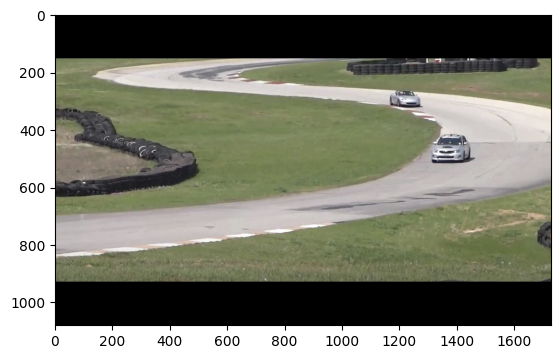

In [109]:
#Displaying the 1st frame from the video
ret,frame=video.read() #video.read return 2 value, a bool =ret and frame=frame in numpy array (height,width,3)

plt.imshow(frame[:,:,::-1]) #Just like in images the matplotlib have to be in reverse  to make it rgb instaead of bgr
#The image below is the 1s frame of the video

###  Displaying Video in Colab

To **display video inside a Colab notebook**, we use:



In [110]:
#Displaying the video
#for video using ipython video
from IPython.display import Video

Video('race_car.mp4',embed=True,width=720 )


##  Writing Video Files with OpenCV

To save video frames into a file, OpenCV provides the `cv2.VideoWriter()` class. This allows us to **write a sequence of images (frames) into a video format** such as `.avi` or `.mp4`.

Before writing frames, the `VideoWriter` object must be properly initialized with the following parameters:

- **Filename**: The output video file name (e.g., `'output.avi'` or `'output.mp4'`).
- **FourCC Code**: A 4-character code that specifies the codec  
  (e.g., `'MJPG'` for AVI, `'mp4v'` for MP4).
- **Frame Rate**: The number of frames per second (e.g., `10` FPS).
- **Frame Size**: The resolution of the video as a tuple `(width, height)`.  
  These values are typically obtained from the original video using `video.get()`  
  and should be converted to `int` since OpenCV returns them as `float`.

>  **Note**: Unlike reading a video (where we open and read frame-by-frame),  
> video writing **starts by initializing the writer object**, and then we write frames into it using `.write(frame)`.

This process compiles the frames into a continuous video in the specified format.


In [111]:
#Writing Video using Video write

#VideoWrite object=cv2.VideoWriter(output_filename,fourcc,frame rate, frame size) #NeeD to understan these parameters??

#resolution is in float, need to convert in int  ??? idk whats hapenening here
frame_width=int(video.get(3))
frame_height=int(video.get(4))

#Outputting the video in desired format

out_avi=cv2.VideoWriter('race_ca_out.avi',cv2.VideoWriter_fourcc('M','J','P','G'),10,(frame_width,frame_height))
out_mp4=cv2.VideoWriter('race_car_out.mp4',cv2.VideoWriter_fourcc(*'mp4v'),10,(frame_width,frame_height))

## Writing Frames to a Video File

Once the `VideoWriter` object is initialized, frames are written inside a loop until the video ends.

- Each frame is read from the input video one by one.
- If the frame is successfully read, it's written to the output video(s) using the writer object.
- This process continues frame-by-frame until there are no more frames to read.

### Releasing Resources

After all frames are processed:

- The input video capture and output writer objects must be released.
- This step is essential to finalize the output video files and free up system resources.
- If not released properly, the output video may become incomplete or corrupted.


In [112]:
#Reading untill the videos is finished
while (video.isOpened()):
  #Capture frame by frame
  ret,frame=video.read()

  if ret==True:
    out_avi.write(frame)
    out_mp4.write(frame)
  else:
    break
#Releasing Video Capture and video Writer
video.release()
out_avi.release()
out_mp4.release()

---

### 🔗 Module Navigation



[![⬅️ Module 05](https://img.shields.io/badge/Module-05-blue?style=for-the-badge&logo=github)](https://github.com/Adityeah18/opencv/tree/main/05)
&nbsp;&nbsp;&nbsp;
[![➡️ Module 07](https://img.shields.io/badge/Module-07-blue?style=for-the-badge&logo=github)](https://github.com/Adityeah18/opencv/tree/main/07)
